<a href="https://colab.research.google.com/github/Aravindh4404/FYPSeagullClassification01/blob/main/G_Karpathy_HQSBNGW_2310.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
import numpy as np
import random

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Mount Google Drive to save and load the model
from google.colab import drive
drive.mount('/content/drive')

# Define the folder to save model checkpoints
checkpoint_folder = '/content/drive/My Drive/FYP/ModelCheckpointsHQ/'
os.makedirs(checkpoint_folder, exist_ok=True)

# Data Augmentation for Training Set
transform_train = transforms.Compose([
    transforms.Resize((300, 300)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
])

# Simple resizing for validation and test sets
transform_val_test = transforms.Compose([
    transforms.Resize((300, 300)),
    transforms.ToTensor(),
])

# Data preparation: Training, Validation, and Test sets
data_path = '/content/drive/My Drive/FYP/Dataset/HQSBNGW/train'
test_data_path = '/content/drive/My Drive/FYP/Dataset/HQSBNGW/test'

# Load datasets
train_dataset = datasets.ImageFolder(data_path, transform=transform_train)
test_dataset = datasets.ImageFolder(test_data_path, transform=transform_val_test)

# Split the dataset into 80% training and 20% validation
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

# Create data loaders with increased batch size for better stability
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Use Pre-trained ResNet50 model and modify it for binary classification
class ResNet50Modified(nn.Module):
    def __init__(self):
        super(ResNet50Modified, self).__init__()
        self.resnet = models.resnet50(pretrained=True)
        num_ftrs = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        return self.resnet(x)

# Initialize the ResNet50 model
model = ResNet50Modified()

# Define loss function and optimizer with increased L2 regularization
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0005, weight_decay=1e-3)

# Learning rate scheduler to reduce learning rate if validation loss plateaus
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)

# Early stopping class to monitor validation loss
class EarlyStopping:
    def __init__(self, patience=5, verbose=False):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss, model, folder_path):
        if self.best_loss is None:
            self.best_loss = val_loss
            self.save_model(model, folder_path)
        elif val_loss >= self.best_loss:
            self.counter += 1
            if self.counter >= self.patience:
                if self.verbose:
                    print("Early stopping triggered!")
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.save_model(model, folder_path)
            self.counter = 0

    def save_model(self, model, folder_path):
        model_save_path = os.path.join(folder_path, "resnetbest_model3010.pth")
        torch.save(model.state_dict(), model_save_path)
        print(f"Best model saved with validation loss: {self.best_loss:.4f} at {model_save_path}")

# Initialize early stopping
early_stopping = EarlyStopping(patience=5, verbose=True)

# Training loop with early stopping and learning rate scheduler
def train(model, train_loader, val_loader, criterion, optimizer, scheduler, early_stopping, epochs=20):
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        print(f"Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader):.6f}")

        # Validate the model and check validation loss
        val_loss, val_acc = validate(model, val_loader, criterion)
        scheduler.step(val_loss)

        # Early stopping checks
        early_stopping(val_loss, model, checkpoint_folder)

        if early_stopping.early_stop:
            print("Early stopping - training stopped")
            break

# Validation loop returning loss and accuracy
def validate(model, loader, criterion):
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    print(f'Validation Loss: {val_loss/len(loader):.6f}, Accuracy: {accuracy:.2f}%')
    return val_loss / len(loader), accuracy

# Test function to evaluate on the test set
def test(model, loader, criterion):
    model.eval()
    test_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    print(f'Test Loss: {test_loss/len(loader):.6f}, Test Accuracy: {accuracy:.2f}%')

# Run the full code sequence
train(model, train_loader, val_loader, criterion, optimizer, scheduler, early_stopping, epochs=20)
test(model, test_loader, criterion)


Mounted at /content/drive


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 135MB/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

Epoch [1/20], Loss: 0.539737
Validation Loss: 2.342351, Accuracy: 77.22%
Best model saved with accuracy: 77.2152% at /content/drive/My Drive/FYP/ModelCheckpointsHQ/resnetbest_model2910.pth
Epoch [2/20], Loss: 0.499485
Validation Loss: 0.607954, Accuracy: 77.22%
Epoch [3/20], Loss: 0.487318
Validation Loss: 0.518205, Accuracy: 75.95%
Epoch [4/20], Loss: 0.452295
Validation Loss: 0.952970, Accuracy: 77.22%
Epoch [5/20], Loss: 0.447510
Validation Loss: 0.607849, Accuracy: 78.48%
Best model saved with accuracy: 78.4810% at /content/drive/My Drive/FYP/ModelCheckpointsHQ/resnetbest_model2910.pth
Epoch [6/20], Loss: 0.451922
Validation Loss: 0.455935, Accuracy: 81.01%
Best model saved with accuracy: 81.0127% at /content/drive/My Drive/FYP/ModelCheckpointsHQ/resnetbest_model2910.pth
Epoch [7/20], Loss: 0.419652
Validation Loss: 0.432326, Accuracy: 79.11%
Epoch [8/20], Loss: 0.378764
Validation Loss: 0.440248, Accuracy: 81.01%
Epoch [9/20], Loss: 0.363015
Validation Loss: 1.866116, Accuracy: 44

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms, models, datasets
from PIL import Image
import os

# Mount Google Drive to save and load the model
from google.colab import drive
drive.mount('/content/drive')

# Define the path to the saved model and the specific image
checkpoint_path = '/content/drive/My Drive/FYP/ModelCheckpointsHQ/best_model2310.pth'
image_path = '/content/007.jpg'  # Replace with the actual image file

# Define the transformation for the image (must match the test set transformations)
transform = transforms.Compose([
    transforms.Resize((300, 300)),
    transforms.ToTensor(),
])

# Load the saved model
class ResNet50Modified(nn.Module):
    def __init__(self):
        super(ResNet50Modified, self).__init__()
        self.resnet = models.resnet50(pretrained=True)
        # Replace the final fully connected layer to output 2 classes (Slaty-backed, Glaucous-winged)
        num_ftrs = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Dropout(0.5),  # Add dropout to the fully connected layer
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        return self.resnet(x)

# Initialize and load the saved model
model = ResNet50Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

print(f"Model loaded from {checkpoint_path}")

# Function to preprocess and load a single image
def preprocess_image(image_path):
    """Load an image and apply transformations."""
    image = Image.open(image_path).convert("RGB")
    image = transform(image)  # Apply the defined transformations
    image = image.unsqueeze(0)  # Add a batch dimension
    return image

# Retrieve class names directly from the training dataset directory
data_path = '/content/drive/My Drive/FYP/Dataset/Original_Adult_In-flight/train'
temp_dataset = datasets.ImageFolder(data_path)
class_names = list(temp_dataset.class_to_idx.keys())
print(f"Class names: {class_names}")

# Function to predict the class of the given image
def predict_image(model, image_tensor, class_names):
    """Predict the class of an image using the trained model."""
    with torch.no_grad():
        outputs = model(image_tensor)
        _, predicted = torch.max(outputs, 1)
        return class_names[predicted.item()]

# Preprocess the image
image_tensor = preprocess_image(image_path)

# Predict the class of the image
predicted_class = predict_image(model, image_tensor, class_names)
print(f"Predicted class: {predicted_class}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-2-23773d4ccd97>:38: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))


Model loaded from /content/drive/My Drive/FYP/ModelCheckpointsHQ/best_model2310.pth
Class names: ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']
Predicted class: Slaty_Backed_Gull


Mounted at /content/drive


<ipython-input-4-77df17e7c07d>:37: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
/usr/lo

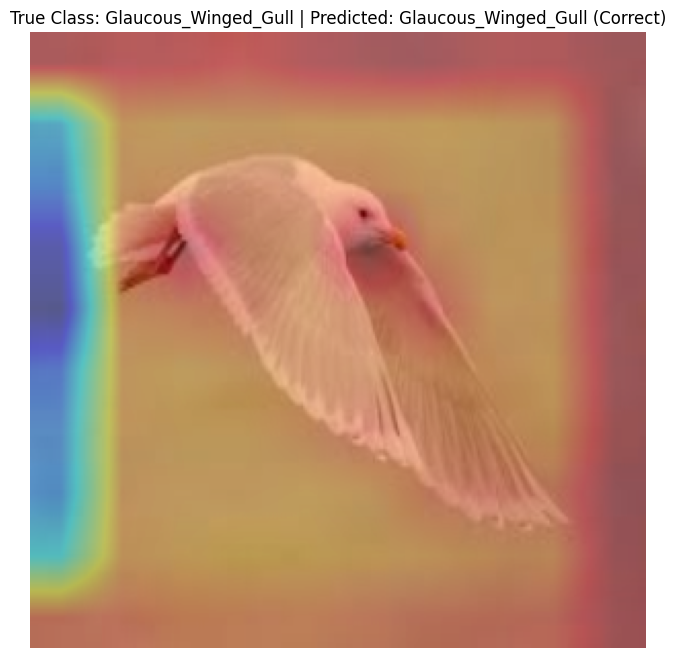

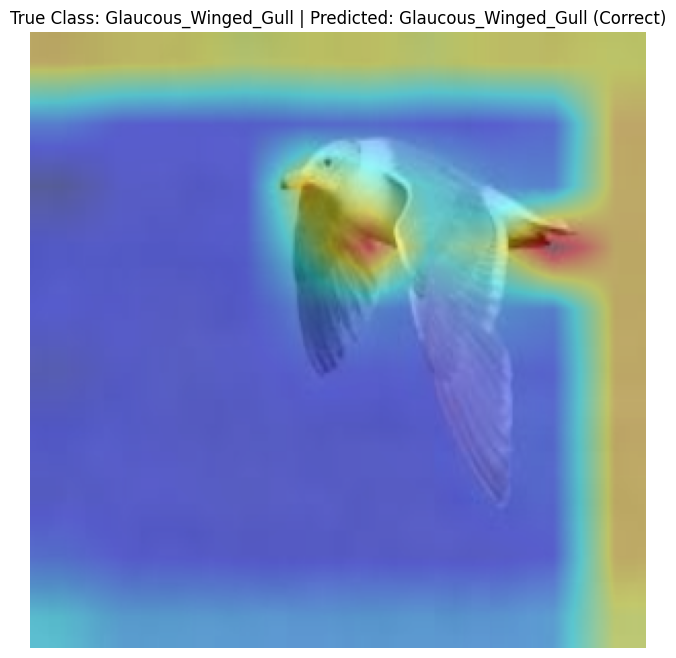

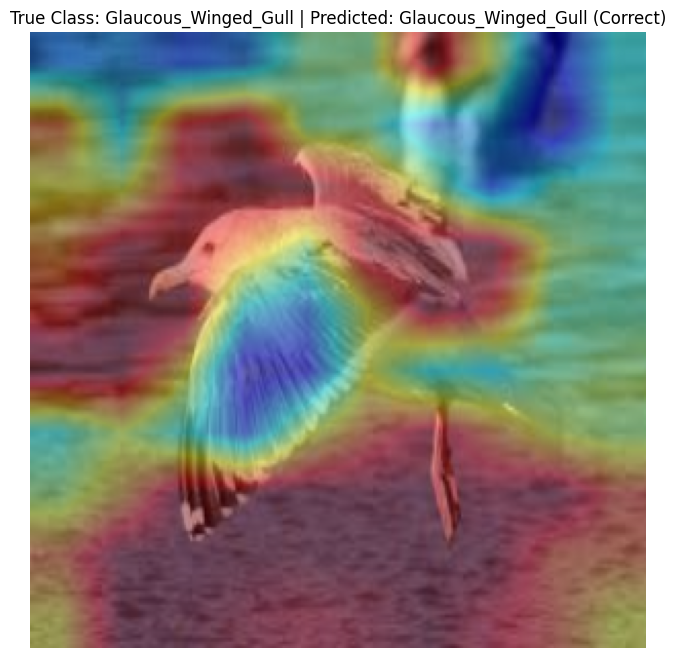

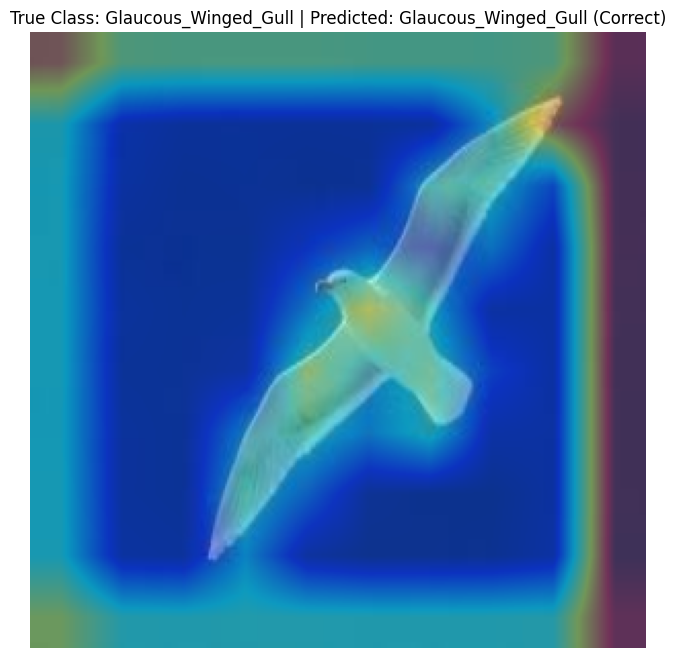

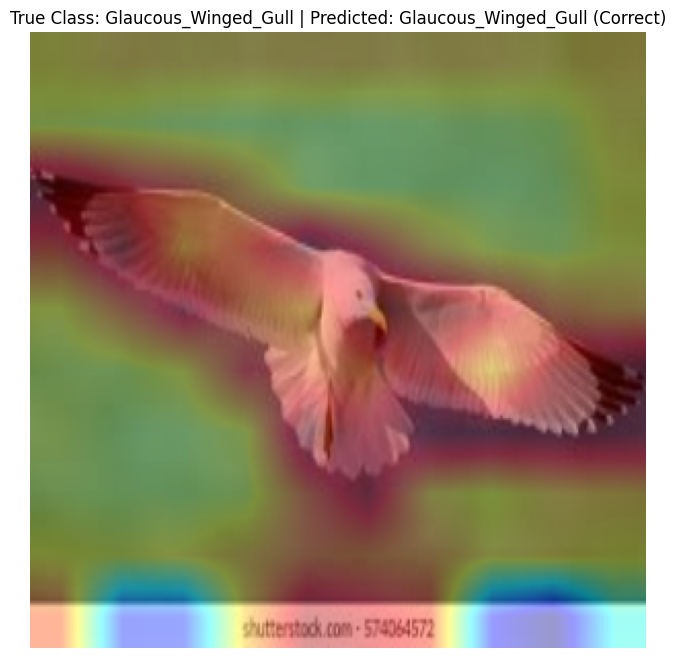

...

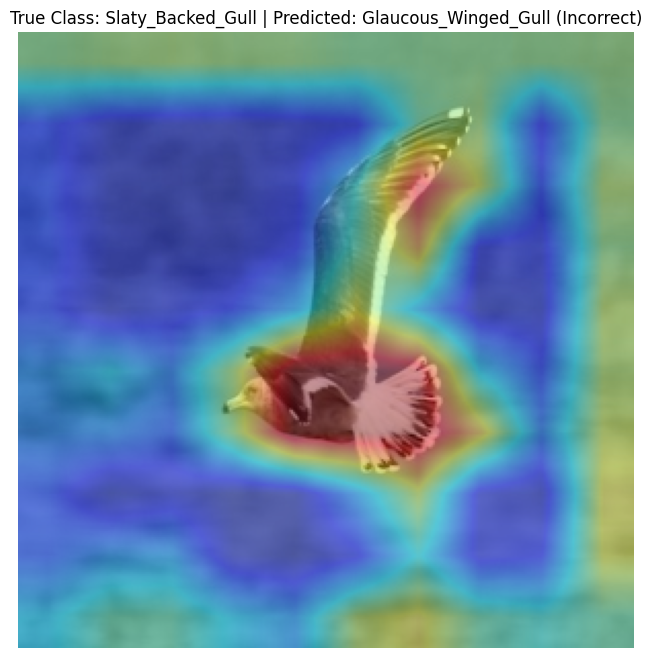

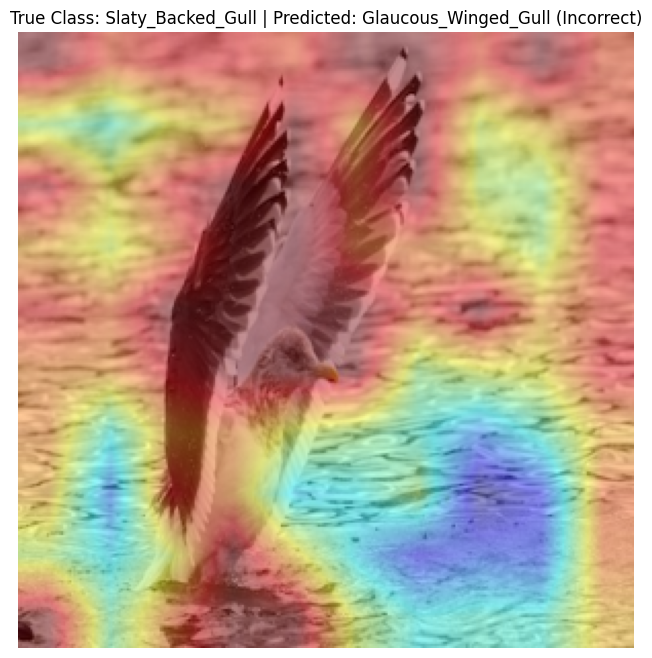

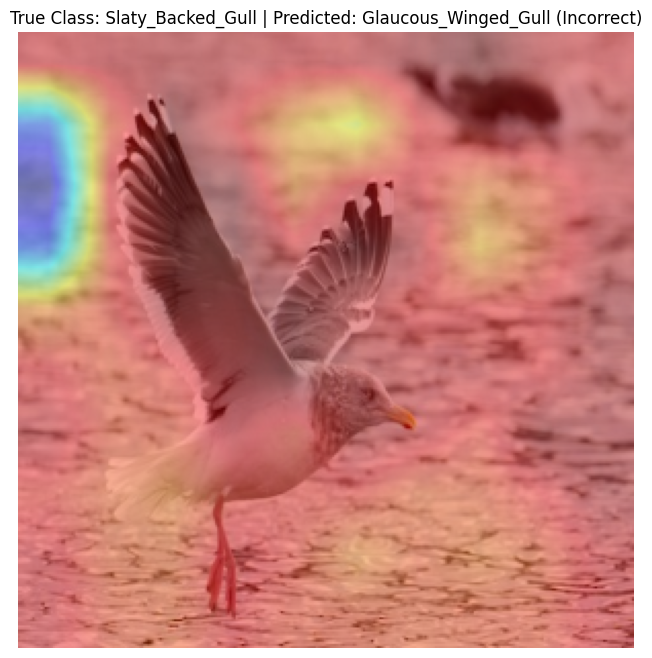

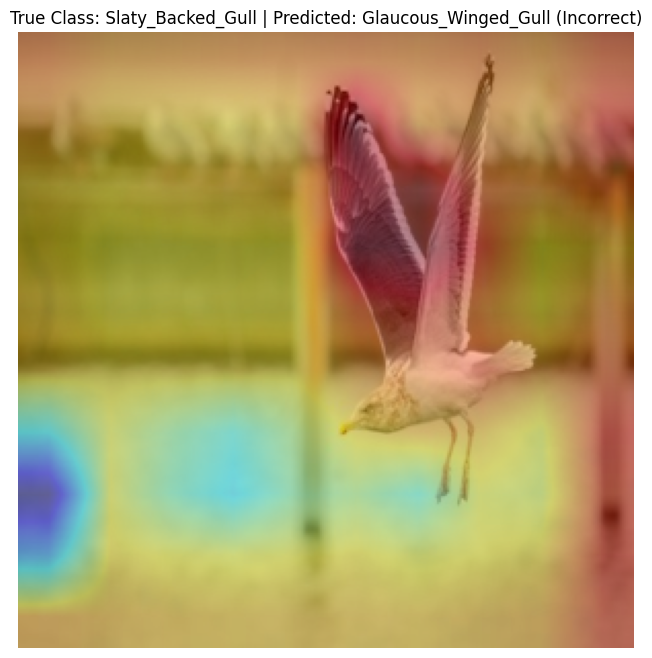

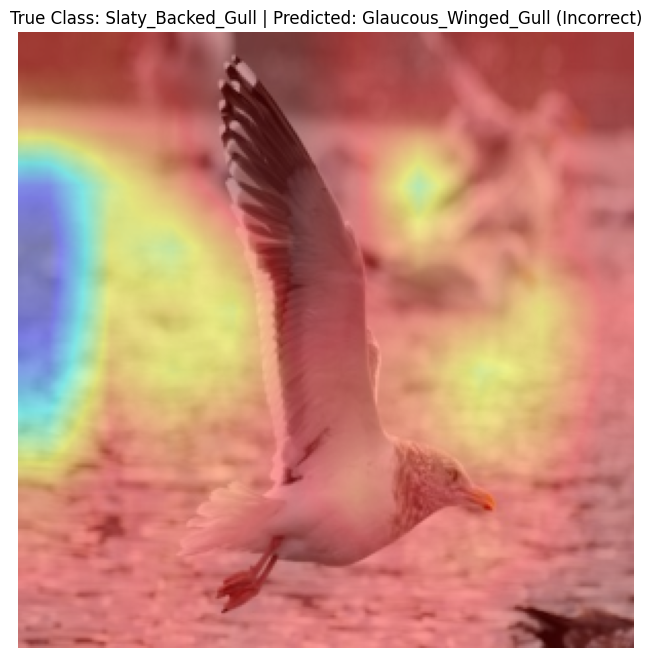

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms, models, datasets
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define the transformation for the image (must match the test set transformations)
transform = transforms.Compose([
    transforms.Resize((300, 300)),  # Resize image to 300x300 pixels
    transforms.ToTensor(),  # Convert image to tensor
])

# Define the modified ResNet50 model
class ResNet50Modified(nn.Module):
    def __init__(self):
        super(ResNet50Modified, self).__init__()
        self.resnet = models.resnet50(pretrained=True)
        num_ftrs = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)  # Adjust for 2 output classes
        )

    def forward(self, x):
        return self.resnet(x)

# Initialize and load the saved model
checkpoint_path = '/content/drive/My Drive/FYP/ModelCheckpointsHQ/resnetbest_model2910.pth'
model = ResNet50Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

# Load class names from training dataset directory
data_path = '/content/drive/My Drive/FYP/Dataset/HQSBNGW/train'
temp_dataset = datasets.ImageFolder(data_path)
class_names = list(temp_dataset.class_to_idx.keys())

# Function to preprocess a single image
def preprocess_image(image_path):
    image = Image.open(image_path).convert("RGB")
    image = transform(image)
    image = image.unsqueeze(0)
    return image

# Function to generate Grad-CAM heatmap for an image
def generate_gradcam(model, image_tensor, target_layer):
    model.eval()
    features, grads = [], []

    def save_features_hook(module, input, output):
        features.append(output)

    def save_grads_hook(module, grad_in, grad_out):
        grads.append(grad_out[0])

    hook1 = target_layer.register_forward_hook(save_features_hook)
    hook2 = target_layer.register_backward_hook(save_grads_hook)

    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    model.zero_grad()
    output[0, predicted_class_idx].backward()

    gradient = grads[0].cpu().data.numpy()[0]
    feature_map = features[0].cpu().data.numpy()[0]

    weights = np.mean(gradient, axis=(1, 2))
    cam = np.zeros(feature_map.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * feature_map[i]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))
    cam -= np.min(cam)
    cam /= np.max(cam)

    hook1.remove()
    hook2.remove()

    return cam, predicted_class_idx

# Test path directory
test_path = '/content/drive/My Drive/FYP/Dataset/HQSBNGW/test'
test_dataset = datasets.ImageFolder(test_path, transform=transform)

# Set target layer for Grad-CAM
target_layer = model.resnet.layer4[-1]

# Process each image in the test dataset
for idx, (image, label) in enumerate(test_dataset):
    image_tensor = image.unsqueeze(0)  # Add batch dimension
    cam, predicted_class_idx = generate_gradcam(model, image_tensor, target_layer)
    predicted_class = class_names[predicted_class_idx]
    true_class = class_names[label]

    # Display original image with Grad-CAM heatmap overlay
    original_image = image_tensor.squeeze().permute(1, 2, 0).numpy()
    original_image = (original_image - np.min(original_image)) / (np.max(original_image) - np.min(original_image))

    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam_image = 0.4 * heatmap + 0.6 * original_image

    # Display the image with prediction
    plt.figure(figsize=(8, 8))
    correct = "Correct" if predicted_class == true_class else "Incorrect"
    plt.title(f"True Class: {true_class} | Predicted: {predicted_class} ({correct})")
    plt.imshow(cam_image)
    plt.axis('off')
    plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-9-33846146c7fb>:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))


Model loaded from /content/drive/My Drive/FYP/ModelCheckpointsHQ/resnetbest_model2910.pth
Class names: ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']


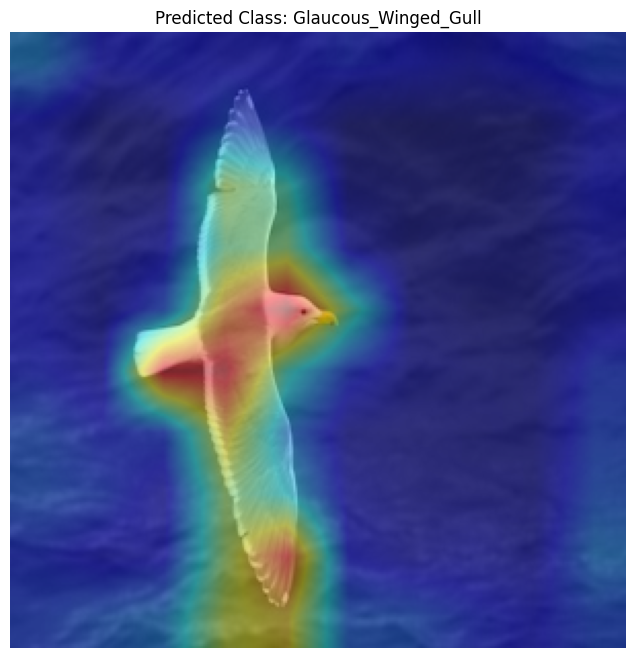

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms, models, datasets
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

# Mount Google Drive to save and load the model
from google.colab import drive
drive.mount('/content/drive')

# Define the path to the saved model and the specific image
checkpoint_path = '/content/drive/My Drive/FYP/ModelCheckpointsHQ/resnetbest_model2910.pth'
image_path = '/content/4tg4580.jpg'

# Define the transformation for the image (must match the test set transformations)
transform = transforms.Compose([
    transforms.Resize((300, 300)),  # Resize image to 300x300 pixels
    transforms.ToTensor(),  # Convert image to tensor
])

# Define the modified ResNet50 model
class ResNet50Modified(nn.Module):
    def __init__(self):
        super(ResNet50Modified, self).__init__()
        self.resnet = models.resnet50(pretrained=True)
        # Replace the final fully connected layer to output 2 classes
        num_ftrs = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Dropout(0.5),  # Add dropout to the fully connected layer
            nn.Linear(num_ftrs, 2)  # Adjust for 2 output classes
        )

    def forward(self, x):
        return self.resnet(x)

# Initialize and load the saved model
model = ResNet50Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

print(f"Model loaded from {checkpoint_path}")

# Function to preprocess and load a single image
def preprocess_image(image_path):
    """Load an image and apply transformations."""
    image = Image.open(image_path).convert("RGB")  # Convert image to RGB
    image = transform(image)  # Apply the defined transformations
    image = image.unsqueeze(0)  # Add a batch dimension
    return image

# Retrieve class names directly from the training dataset directory
data_path = '/content/drive/My Drive/FYP/Dataset/HQSBNGW/train'
temp_dataset = datasets.ImageFolder(data_path)
class_names = list(temp_dataset.class_to_idx.keys())
print(f"Class names: {class_names}")

# Function to generate Grad-CAM heatmap and show the predicted class
def generate_gradcam(model, image_tensor, target_layer, class_names):
    # Set model to evaluation mode
    model.eval()
    features = []
    grads = []

    # Hook functions to capture features and gradients
    def save_features_hook(module, input, output):
        features.append(output)

    def save_grads_hook(module, grad_in, grad_out):
        grads.append(grad_out[0])

    # Register hooks to capture target layer output and gradients
    hook1 = target_layer.register_forward_hook(save_features_hook)
    hook2 = target_layer.register_backward_hook(save_grads_hook)

    # Forward pass
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()
    predicted_class = class_names[predicted_class_idx]

    # Backward pass to get gradients
    model.zero_grad()
    class_loss = output[0, predicted_class_idx]
    class_loss.backward()

    # Get gradients and feature maps
    gradient = grads[0].cpu().data.numpy()[0]
    feature_map = features[0].cpu().data.numpy()[0]

    # Calculate Grad-CAM
    weights = np.mean(gradient, axis=(1, 2))  # Global average pooling of the gradients
    cam = np.zeros(feature_map.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * feature_map[i]

    cam = np.maximum(cam, 0)  # ReLU to remove negative values
    cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))  # Resize to image dimensions
    cam -= np.min(cam)
    cam /= np.max(cam)  # Normalize between 0 and 1

    # Convert original image to show on heatmap
    original_image = image_tensor.squeeze().permute(1, 2, 0).cpu().numpy()
    original_image = (original_image - np.min(original_image)) / (np.max(original_image) - np.min(original_image))

    # Create heatmap
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam_image = 0.4 * heatmap + 0.6 * original_image

    # Show the image with the predicted class name
    plt.figure(figsize=(8, 8))
    plt.title(f"Predicted Class: {predicted_class}")
    plt.imshow(cam_image)
    plt.axis('off')
    plt.show()

    # Remove hooks
    hook1.remove()
    hook2.remove()

# Set the target layer for Grad-CAM
target_layer = model.resnet.layer4[-1]

# Preprocess the image
image_tensor = preprocess_image(image_path)

# Generate Grad-CAM for the specific image and show the predicted class
generate_gradcam(model, image_tensor, target_layer, class_names)


DEBUGGING CHECK CLASSES AND OTHER STUFF ISNCE ALL IMAGES ARE PREDICTED GLAUCOUS WINGED

In [ ]:
# Load the current dataset to get class names and indices
data_path = '/content/drive/My Drive/FYP/Dataset/HQSBNGW/train'
temp_dataset = datasets.ImageFolder(data_path)
current_class_to_idx = temp_dataset.class_to_idx

# Print current class names and their indices as detected by ImageFolder
print("Current class-to-index mapping:", current_class_to_idx)


Current class-to-index mapping: {'Glaucous_Winged_Gull': 0, 'Slaty_Backed_Gull': 1}
